<a href="https://colab.research.google.com/github/kabhishek20/Dashtoon_GenAI/blob/main/Kumar_Abhishek_Dashtoon.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Introduction**

**Name**: Kumar Abhishek     
**College**: IIT Kanpur                                        
**Interests**: Generative AI, LLMs, Data Science and Analytics, NLP, CV

Data Source: <a href="https://commons.wikimedia.org/wiki/Main_Page"> Click Here </a>

**Inputs:** Content Image + Artistics Style    
**Output:** Base image with new Artistic Style      

*RESULTS OF THE MODEL ARE GIVEN BELOW👇*

**Sample Output 1**
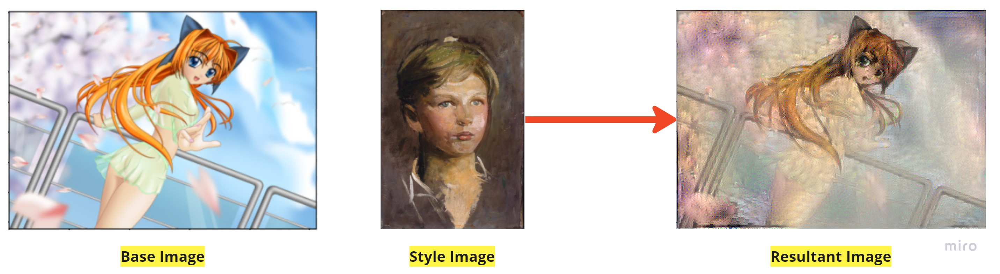

**Sample Output 2**
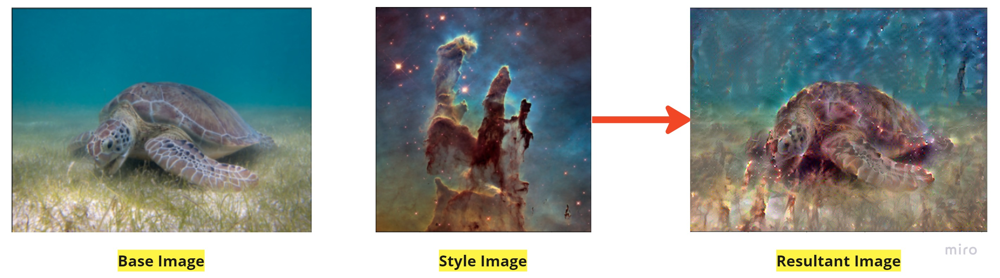

**Sample Output 3**
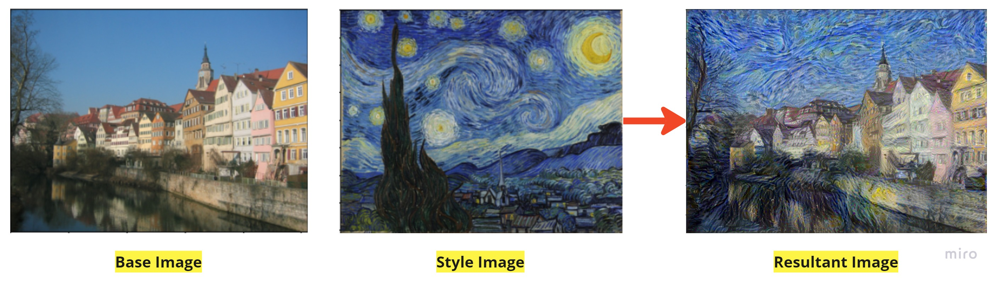

**Sample Output 4**
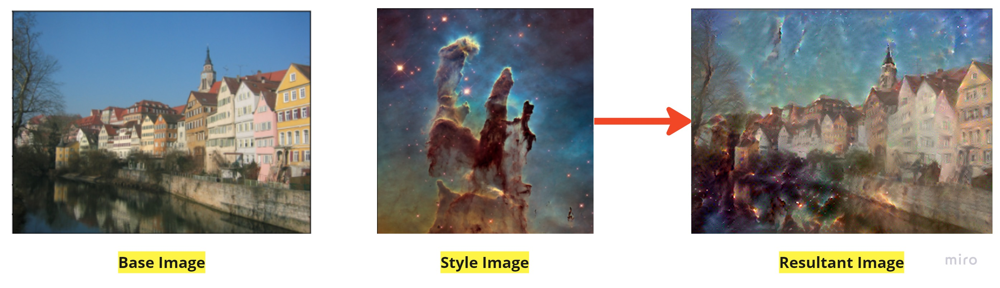

### **Importing Necessary Libraries** [*Connect to GPU-T4 runtime*]

In [ ]:
import os
import time
import functools
import numpy as np
from PIL import Image
import IPython.display
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt
from tensorflow.python.keras import models
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K
from tensorflow.keras.preprocessing import image as kp_image

### **Downloading Sample Images**

In [ ]:
img_dir = '/tmp/nst'
if not os.path.exists(img_dir):
    os.makedirs(img_dir)
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg

In [ ]:
# Setting the default properties of matplotlib [figsize = (10,10), axes = Off]

mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

In [ ]:
# Path to the image which will be the base image [ New/Original Artwork ]
content_path="/tmp/nst/Tuebingen_Neckarfront.jpg"

# Path to the image with some Artistic Style
style_path="/tmp/nst/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg"

### **Base Image and Artistic Style Image**

In [ ]:
# Loading image from path and preprocessing it
def load_img(img_path):
  # Setting the maximum image dimension
  max_dim = 512
  img = Image.open(img_path)
  # Determining the maximum dimension of the image and scaling it accordingly
  long = max(img.size)
  scale = max_dim/long
  # ANTIALIAS method of resizing is used because it gives smoother results
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  # Convert image to a numpy array
  img = kp_image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  return img

In [ ]:
# Function to display an image using matplotlib
def imshow(img, title=None):
  # Removes the batch dimension added during processing
  output = np.squeeze(img, axis=0)
  output = output.astype('uint8')
  plt.imshow(output)
  if title is not None:
    plt.title(title)
  plt.imshow(output)

<ipython-input-6-8135b4a192c4>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


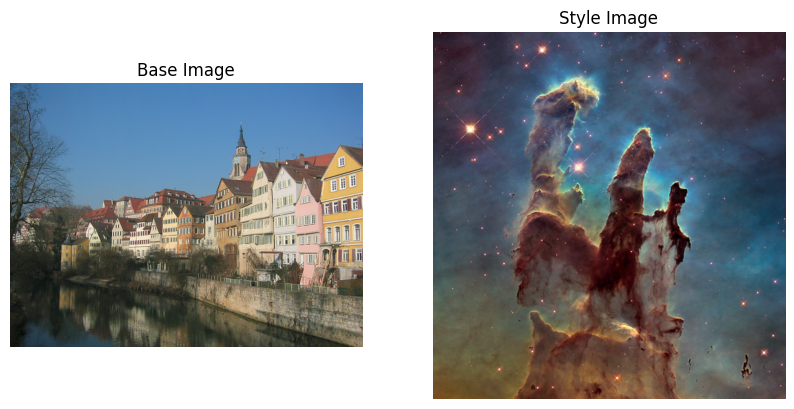

In [ ]:
# Plotting the base image and the style image
content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Base Image')
plt.axis('off')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.axis('off')
plt.show()

### **Preparing Data**
##### *To get the content and style representation of our image, we will use neural networks, concept of deep learning and to get higher accuracy without the use of any advanced GPU, we can use the concept of transfer learning as well*

In [ ]:
'''VGG19 is a pretrained image classification model, but our task is not of classification
so we will not use that model directly, we will use its preprocessing layers as it will
be more efficient and accurate, and to extract features from the image we will use the
convolutional layer present in the network architecture.'''

def load_and_process_img(path_to_img):
  img = load_img(path_to_img)
  # using the preprocessing layer of VGG19 to process the input image
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

In [ ]:
# In order to view the output, we need to perform inverse preprocessing step

def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")

  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

### **Building Model**
##### *In this case we use layers of VGG19 in our CNN to extract the feature maps of the content,style, and generated images. VGG19 layers are used instead of ResNet, Inceptions etc. becuse it is relatively simple and the lack of time to deep dive into other models*

In [ ]:
'''In order to get the content and style representation of our image, intermediate layer
are used. This is because of the fact that for performing classification VGG19 first
understands the image, its features and that is exactly we want to capture.'''

# Content layer where will pull our feature maps
content_layers = ['block5_conv2']

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
''' Creates the required model with access to intermediate layers

This function will load the VGG19 model and access the intermediate layers. These
layers will then be used to create a new model that will take input image and return
the output from the intemediate layer

Function Return: keras model that take image inputs and outputs the style and content
'''

def get_model():
  # Load the model without the top layer and set trainable to false : Transfer Learning
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  # Getting output layers corresponding to style and content layers
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs

  # Building model
  return models.Model(vgg.input, model_outputs)

### **Content and Style Loss Functions**

#### Content Loss
##### *Content loss definition is quite simple here: We'll pass the model both the desired content image and base input image. This will return the intermediate layer outputs (from the model defined above), then we take the eucledian distance between two intermediate representations of the images*
 *More formally, content loss is a function that describes the distance of content from our output image $x$ and our content image, $p$.Let $C_{nn}$ be a deep convolutional neural network. Let $X$ be any image, then $C_{nn}(X)$ is the network fed by X. Let $F^l_{ij}(x) \in C_{nn}(x)$ and $P^l_{ij}(p) \in C_{nn}(p)$ describe the respective intermediate feature representation of the network with inputs $x$ and $p$ at layer $l$. Then we describe the content distance (loss) formally as: $$L^l_{content}(p, x) = \sum_{i, j} (F^l_{ij}(x) - P^l_{ij}(p))^2$$*

In [ ]:
'''Adding the content losses at each layer. This way in each iteration we feed our
input image through the model, all the content losses through the model will be
properly compute and because we are executing eagerly, all gradient will be computed'''

def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

#### Style Loss
##### *Computing style loss is bit more involved but is done in a similar way, but this time feeding the network with base image and the style image. However instead of comparing raw intermediate outputs , we instead compare Gram matrices of the two outputs.*
*Mathematically, we describe the style loss of the base input image, $x$, and the style image, $a$, as the distance between the style representation (the gram matrices) of these images. We describe the style representation of an image as the correlation between different filter responses given by the Gram matrix  $G^l$, where $G^l_{ij}$ is the inner product between the vectorized feature map $i$ and $j$ in layer $l$. We can see that $G^l_{ij}$ generated over the feature map for a given image represents the correlation between feature maps $i$ and $j$.*
*To generate a style for our base input image, we perform gradient descent from the content image to transform it into an image that matches the style representation of the original image. We do so by minimizing the mean squared distance between the feature correlation map of the style image and the input image. The contribution of each layer to the total style loss is described by
$$E_l = \frac{1}{4N_l^2M_l^2} \sum_{i,j}(G^l_{ij} - A^l_{ij})^2$$

where $G^l_{ij}$ and $A^l_{ij}$ are the respective style representation in layer $l$ of $x$ and $a$. $N_l$ describes the number of feature maps, each of size $M_l = height * width$. Thus, the total style loss across each layer is
$$L_{style}(a, x) = \sum_{l \in L} w_l E_l$$
where we weight the contribution of each layer's loss by some factor $w_l$. In our case, we weight each layer equally ($w_l =\frac{1}{|L|}$)*


In [ ]:
'''
The function take the feature map of a layer from neural network and computes
its Gram matrix. Gram Matrix is a way to represent the style information of the
input tensor.
'''
def gram_matrix(input_tensor):
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

'''
This function calculates the style loss between a base style and a target style
(represented by its gram matrix). The style loss is computed as the mean squared
difference between the gram matrix of the base style and the target Gram Matrix
'''
def get_style_loss(base_style, gram_target):
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  return tf.reduce_mean(tf.square(gram_style - gram_target))

### **Apply Style transfer to Base Image**

In [ ]:
'''
The function will simply load and preprocess both the content and style images
from their path. Then it will feed them, to obtain the outputs of the intermediate
layers
'''

def get_feature_representations(model, content_path, style_path):
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)

  style_outputs = model(style_image)
  content_outputs = model(content_image)

  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

### **Total loss and Gradients**

In [ ]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """This function will compute the loss total loss.

  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  """
  style_weight, content_weight = loss_weights

  # Feed our init image through our model. This will give us the content and
  # style representations at our desired layers.
  model_outputs = model(init_image)

  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]

  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)

  # Accumulate content losses from all layers
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)

  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score
  return loss, style_score, content_score

In [ ]:
'''
Computing the Gradients

Here we use tf.GradientTape() to compute the gradient. It allows us to take
advantage of the automatic differentiation available by tracing operations
for computing the gradient later. It records the operations during the forward
pass and then is able to compute the gradient of our loss function with respect
to our input image for the backwards pass.
'''
def compute_grads(cfg):
  with tf.GradientTape() as tape:
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

### **Complete Program with Function Calls**

In [ ]:
def run_style_transfer(content_path,
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3,
                       style_weight=1e-2):
  # We don't need to train any layers of our model, as it is already performing
  # good, if needed we can run the model on some training dataset for few epochs
  model = get_model()
  for layer in model.layers:
    layer.trainable = False

  # Getting the Style and Content Feature
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

  # Setting the initial image
  init_image = load_and_process_img(content_path)
  init_image = tf.Variable(init_image, dtype=tf.float32)
  opt = tf.optimizers.Adam(learning_rate=5, epsilon=1e-1)

  # To display intermediate images while execution
  iter_count = 1

  # Storing the best result
  best_loss, best_img = float('inf'), None

  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }

  # Displaying the result
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()

  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means

  imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time()

    if loss < best_loss:
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      start_time = time.time()
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      imgs.append(plot_img)
      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))
      print('Total loss: {:.4e}, '
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  IPython.display.clear_output(wait=True)
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])

  return best_img, best_loss

In [ ]:
# Displaying the final image along with the base image and style image
def show_results(best_img, content_path, style_path, show_large_final=True):
  plt.figure(figsize=(10, 5))
  content = load_img(content_path)
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  if show_large_final:
    plt.figure(figsize=(10, 10))

    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()

### **Execution - Example 1**

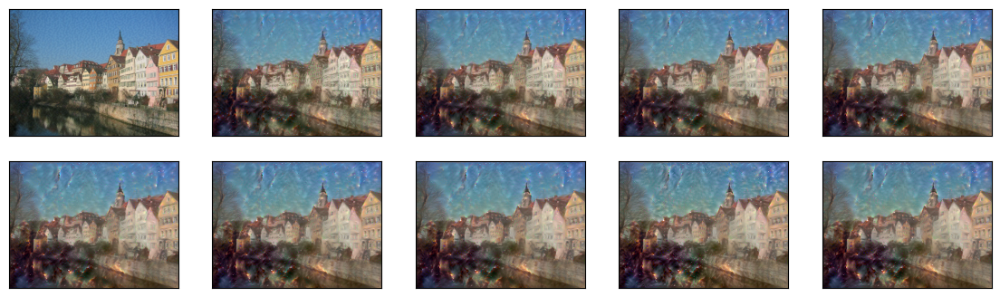

In [ ]:
# Running the model and storing the best result
best, best_loss = run_style_transfer(content_path,
                                     style_path, num_iterations=1000)

<ipython-input-6-8135b4a192c4>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


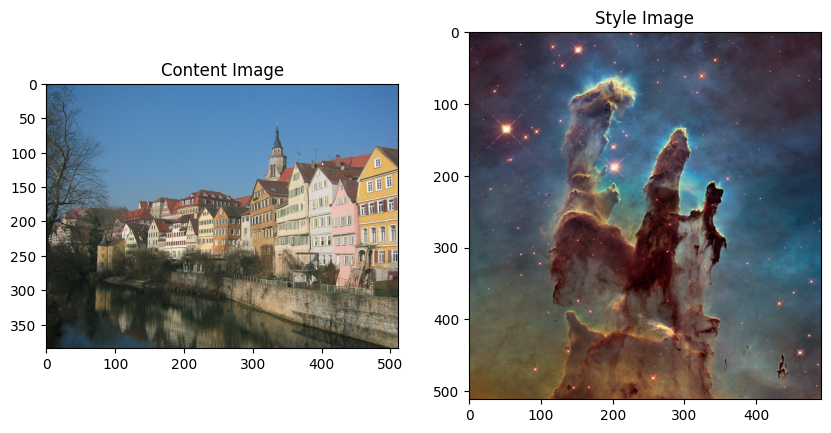

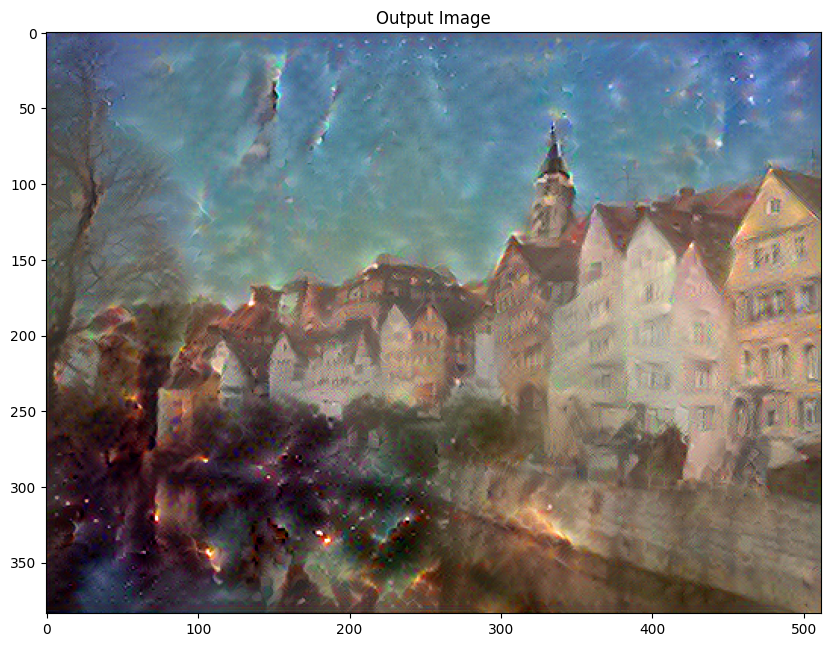

In [ ]:
show_results(best, content_path, style_path)

### **Example 2**

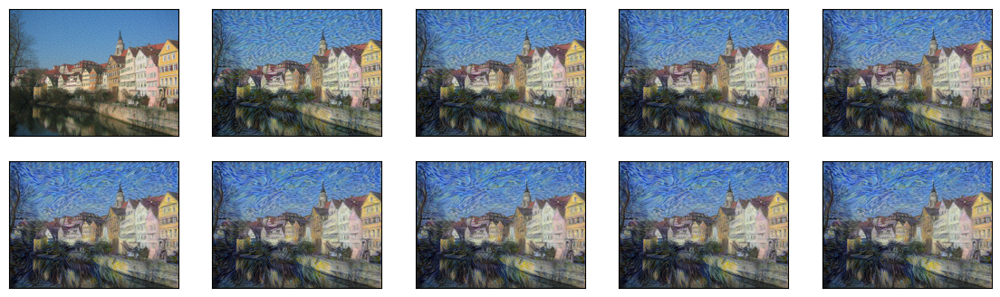

In [ ]:
content_path="/tmp/nst/Tuebingen_Neckarfront.jpg"
style_path="/tmp/nst/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"
best, best_loss = run_style_transfer(content_path, style_path, num_iterations=1000)

<ipython-input-5-8135b4a192c4>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


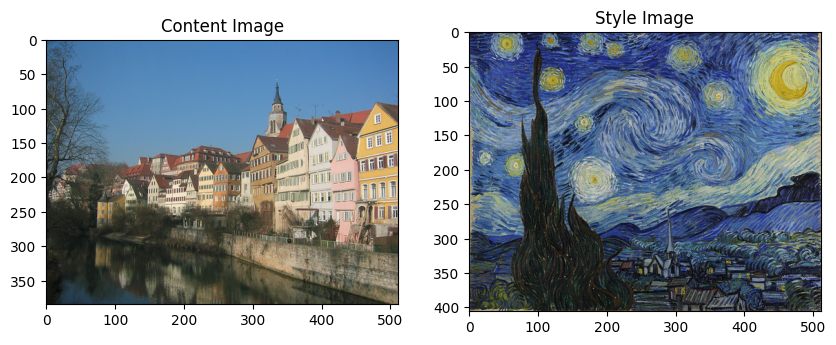

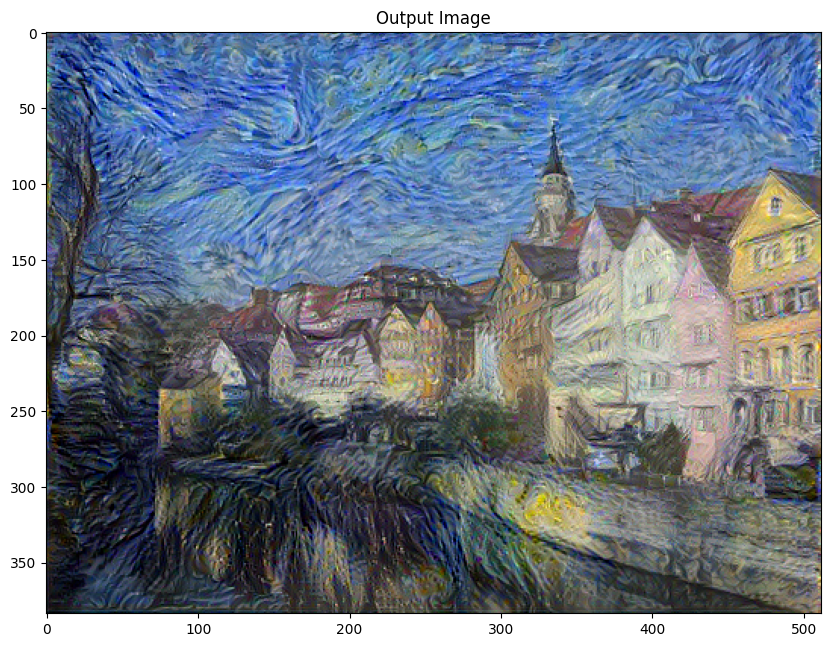

In [ ]:
show_results(best, content_path, style_path)

### **Example-3**

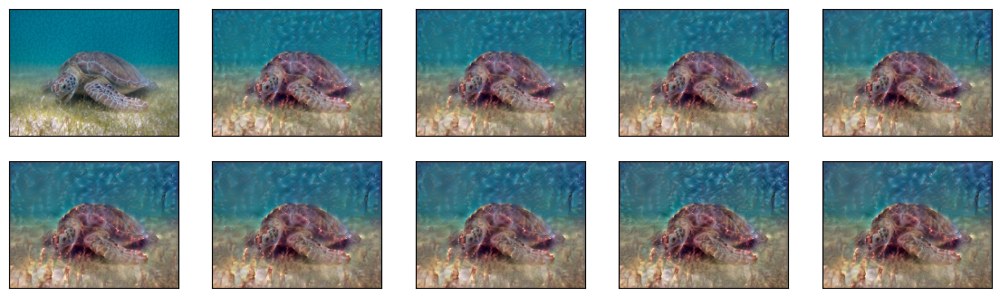

In [ ]:
content_path = '/tmp/nst/Green_Sea_Turtle_grazing_seagrass.jpg'
style_path = '/tmp/nst/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg'
best, best_loss = run_style_transfer(content_path, style_path, num_iterations=1000)

<ipython-input-5-8135b4a192c4>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


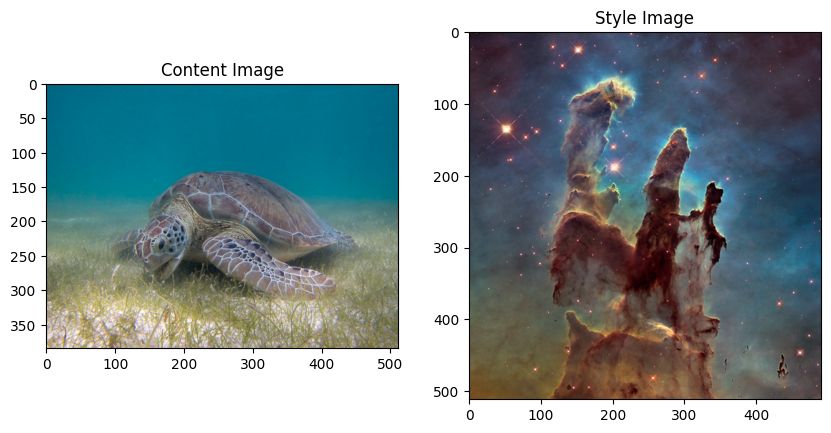

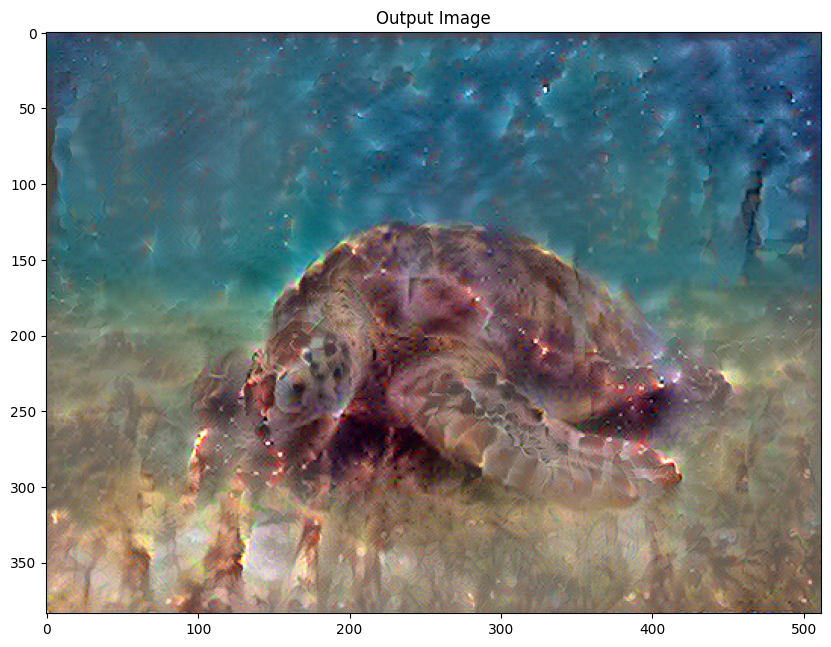

In [ ]:
show_results(best, content_path, style_path)

### **Example-4**

*For example 4, download and use this as the base and style image*

*Base Image*: <a href="https://drive.google.com/file/d/1bdxURq-V5JvLwt4kVv2irvFki4XGUNq_/view?usp=sharing">Click Here</a>

*Style Image*: <a href="https://drive.google.com/file/d/1qbH9P-kGg2U1NqDCWDSxX9laMKvewO8x/view?usp=sharing">Click Here</a>

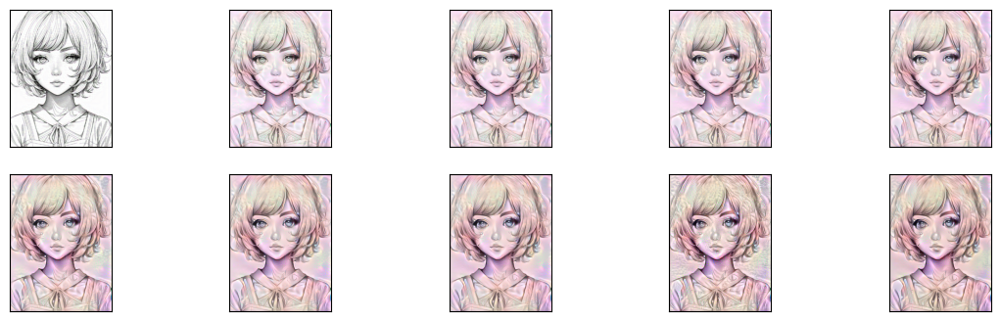

In [ ]:
content_path="/content/base.jpg"
style_path="/content/style.jpg"
best, best_loss = run_style_transfer(content_path, style_path, num_iterations=1000)

<ipython-input-6-8135b4a192c4>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


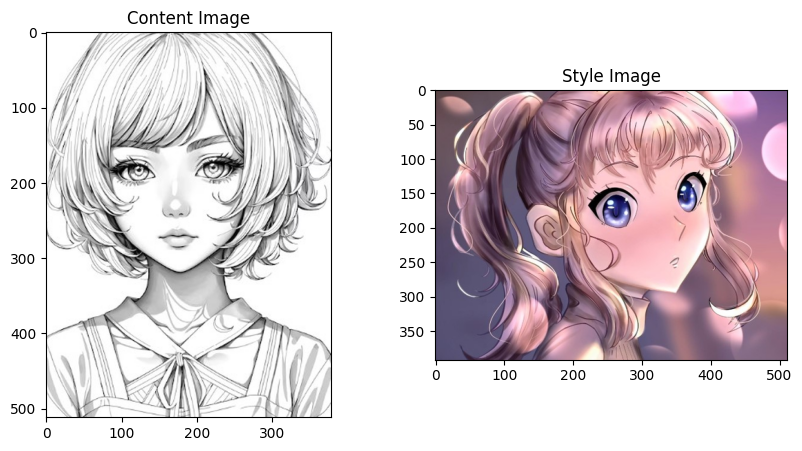

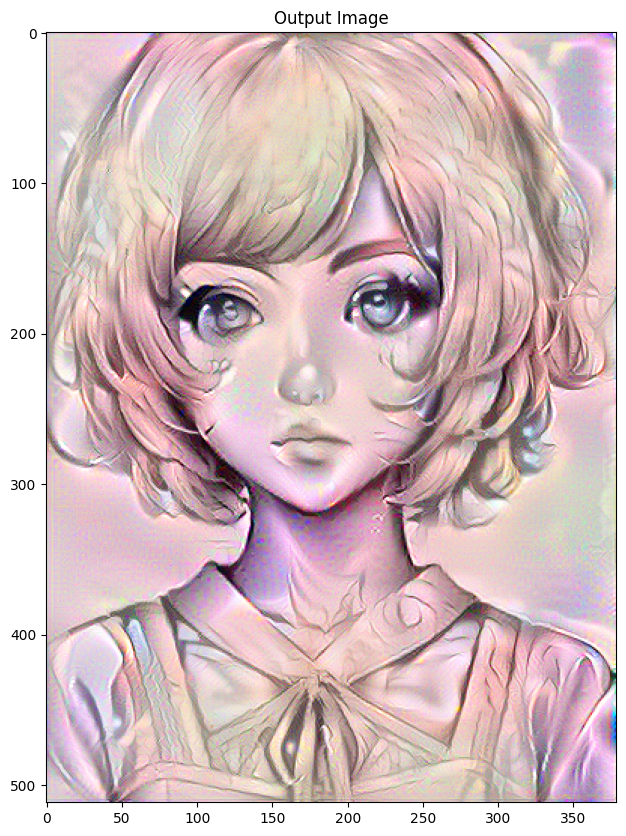

In [ ]:
show_results(best, content_path, style_path)

### **Example 5**

*For example 5, download and use this as the base and style image*

*Base Image*: <a href="https://upload.wikimedia.org/wikipedia/commons/thumb/c/c2/Anime_Girl.svg/640px-Anime_Girl.svg.png">Click Here</a>

*Style Image*: <a href="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b8/Abbott_Handerson_Thayer_-_Oil_Sketch_of_a_Young_Boy_-_1993.161_-_Museum_of_Fine_Arts.jpg/640px-Abbott_Handerson_Thayer_-_Oil_Sketch_of_a_Young_Boy_-_1993.161_-_Museum_of_Fine_Arts.jpg"> Click Here</a>

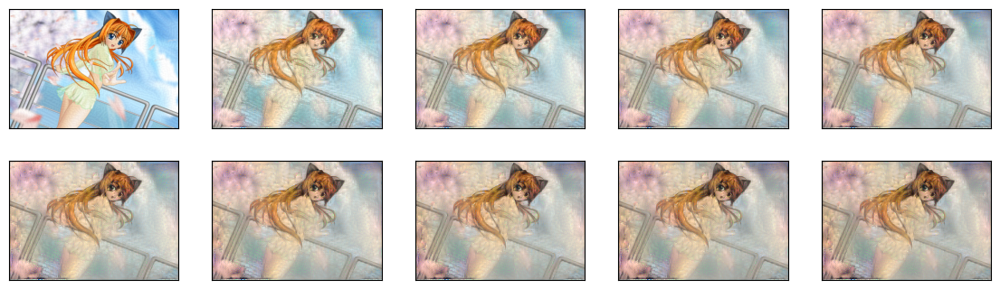

In [ ]:
content_path="/content/base_1.png"
style_path="/content/style_1.jpg"
best, best_loss = run_style_transfer(content_path, style_path, num_iterations=1000)

<ipython-input-6-8135b4a192c4>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


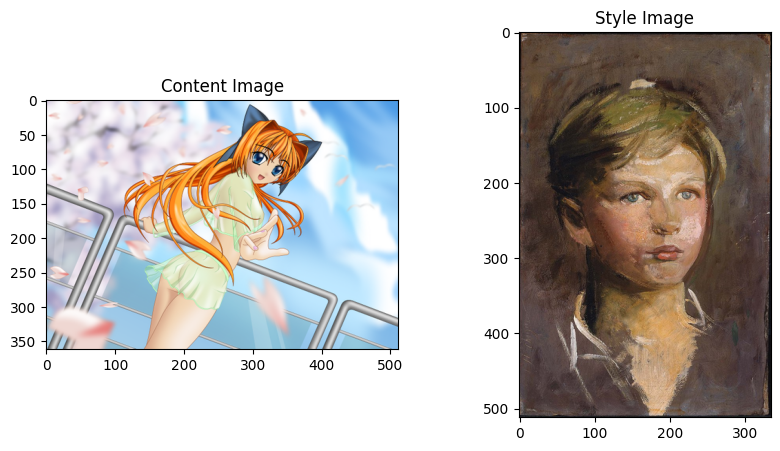

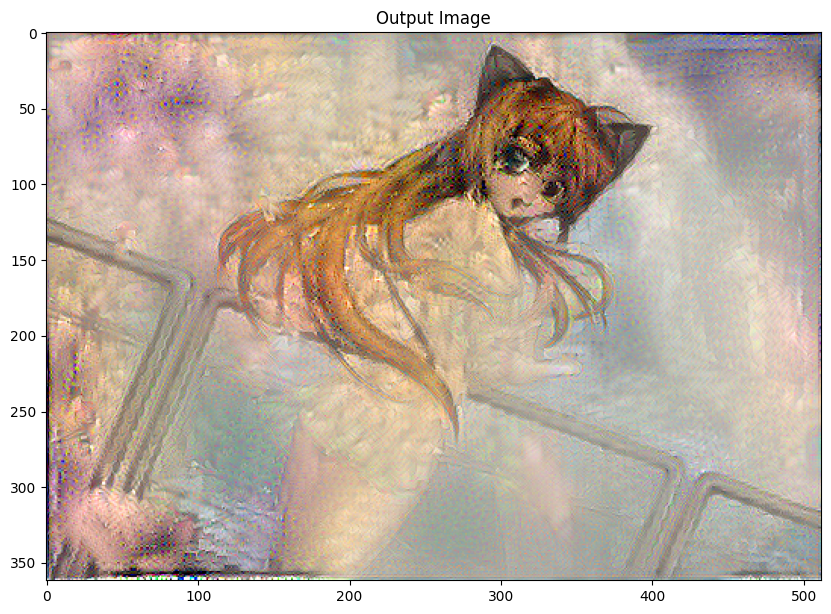

In [ ]:
show_results(best, content_path, style_path)